# Mathematics for AI Assignment 2

- Name: Tan Yu Hoe
- Admin No: P2026309


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
from sympy import *
init_printing()

## Introduction

Given a set of data points with at least one predictor and a continuous response variable, we want to construct a linear model to predict the response. This is the aim of Linear Regression, which is a supervised learning technique.


In [2]:
# import .csv dataset
fish = pd.read_csv('fish.csv')
fish.head()

,Weight,Length,Width
0,67,9.3,1.0476
1,75,10.0,1.1600
2,70,10.1,1.1484
3,72,10.1,1.1821
4,79,10.2,1.2560


In [3]:
# DataFrame information
fish.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Weight  25 non-null     int64  
 1   Length  25 non-null     float64
 2   Width   25 non-null     float64
dtypes: float64(2), int64(1)
memory usage: 728.0 bytes


In [4]:
# Column Statistics
fish.describe().T

,count,mean,std,min,25%,50%,75%,max
Weight,25.0,118.160000,41.331667,67.0000,87.0000,100.0000,136.0000,199.0000
Length,25.0,11.448000,1.177611,9.3000,10.4000,11.3000,12.4000,13.8000
Width,25.0,1.401848,0.289335,1.0476,1.2387,1.2838,1.4467,2.0672


## Simple Linear Regression (SLR)

We defined the **Error Function** as the mean of squared-error (of the whole dataset):

$$ E(a, b) = \frac {1} {n} \sum_{i=1}^{n} (y_i - \hat{y_i})^2$$

where, $ \hat{y_i} = a + b x_i $


## Model 1: SLR with intercept $a$ fixed => $\hat {y} = bx_i$

We will first build a SLR model *Weight (y)* and *Length (x)* as the predictor. Suppose it is believed that weight is directly proportional to length. This means that $\hat{y}$ is a constant multiple of x and $a = 0$. Then, in the SLR model, we will only need to determine the slope $b$:

$$ \hat{y} = bx_i $$

We define the error function as followed:

$$ E(b) = \frac {1} {n} \sum_{i=1}^{n} (y_i - b x_i)^2 $$

In [5]:
from sympy import *
a = 0
b = Symbol('b')
x = Symbol('x_i')
y_hat = Symbol('\hat y')
y = Symbol('y_i')
n = len(fish)
i = Symbol('i')
y_hat = a + b*x
residual = y - y_hat


### (a) Express Error Function $E(b)$ in terms of $b$ only. Hence, derive $E'(b)$


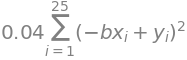

In [6]:
error = 1/n * Sum(residual**2, (i, 1, n))
error

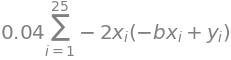

In [7]:
diff(error, b)

### (b) Use univariate gradient descent algorithm to find the value of $b$ for which $E(b) is at its minimum. Write your Python code in a single cell and copy-paste your code below.

In [8]:
# defining x and y
x = fish['Length'].values
y = fish['Weight'].values

model1_b = 1 # Starting value of b
rate = 0.001 # Set learning rate
epsilon = 0.001 # Stop algorithm when absolute difference between 2 consecutive x-values is less than epsilon
diff = 1 # difference between 2 consecutive iterates
max_iter = 5000 # set maximum number of iterations
iter = 1 # iterations counter

deriv = lambda b: 1/25 * np.sum(-2 * x * ( -model1_b * x + y)) ## derivative of loss function
error = lambda b: 1/25 * np.sum((y - model1_b * x)**2) # loss function

# Gradient Descent Algorithm of E(b), finding the minima of the loss function

while diff > epsilon and iter < max_iter:
    b_new = model1_b - rate * deriv(model1_b)
    print("Iteration ", iter, "\tb-value is: ", b_new,"\tE(b) is: ", error(b_new), "\tE'(b) is:", deriv(b_new))
    diff = abs(b_new - model1_b) ## new difference
    iter = iter + 1 ## new iteration
    model1_b = b_new ## new b value
    
print("The local minimum occurs at: ", model1_b)

Iteration  1 	b-value is:  3.530064 	E(b) is:  12939.308 	E'(b) is: -2530.064
Iteration  2 	b-value is:  5.390227774336 	E(b) is:  7385.529378176181 	E'(b) is: -1860.163774336
Iteration  3 	b-value is:  6.7578648251584115 	E(b) is:  4383.410295310418 	E'(b) is: -1367.637050822411
Iteration  4 	b-value is:  7.763384408212268 	E(b) is:  2760.6018253633283 	E'(b) is: -1005.5195830538563
Iteration  5 	b-value is:  8.502666538143457 	E(b) is:  1883.38567988714 	E'(b) is: -739.2821299311886
Iteration  6 	b-value is:  9.046204502839984 	E(b) is:  1409.2026939496864 	E'(b) is: -543.5379646965282
Iteration  7 	b-value is:  9.445826659396024 	E(b) is:  1152.8810276054107 	E'(b) is: -399.62215655604035
Iteration  8 	b-value is:  9.739638459827782 	E(b) is:  1014.3252409450845 	E'(b) is: -293.81180043175823
Iteration  9 	b-value is:  9.955655946988422 	E(b) is:  939.4283104949028 	E'(b) is: -216.01748716063906
Iteration  10 	b-value is:  10.114477187968616 	E(b) is:  898.9424504231667 	E'(b) is: -

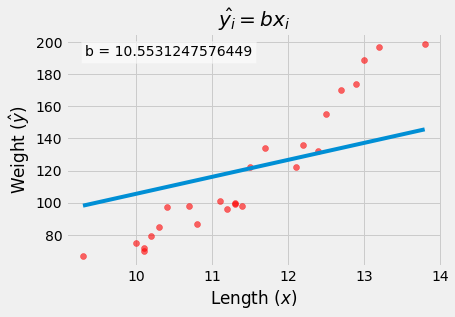

In [9]:
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(x, model1_b*x)
ax.scatter(x, y, alpha=.6, c='red')
textstr = r'b = {}'.format(model1_b)
props = dict(facecolor='white', alpha=.6)
plt.title('$\hat{y_i} = bx_i$')
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14, verticalalignment='top', bbox=props)
plt.ylabel("Weight $(\hat{y})$")
plt.xlabel('Length $({x})$')
plt.show()

### (c) Describe the changes and decisions you made on the parameters for your solution to reach convergence.

In [10]:
# defining x and y
x = fish['Length'].values
y = fish['Weight'].values

model1_b = 1 # Starting value of b
rate = 0.0001 # Set learning rate
epsilon = 0.00001 # Stop algorithm when absolute difference between 2 consecutive x-values is less than epsilon
diff = 1 # difference between 2 consecutive iterates
max_iter = 1000 # set maximum number of iterations
iter = 1 # iterations counter

deriv = lambda b: 1/25 * np.sum(-2 * x * ( -model1_b * x + y)) ## derivative of loss function
error = lambda b: 1/25 * np.sum((y - model1_b * x)**2) # loss function

# Gradient Descent Algorithm of E(b), finding the minima of the loss function

while diff > epsilon and iter < max_iter:
    b_new = model1_b - rate * deriv(model1_b)
    print("Iteration ", iter, "\tb-value is: ", b_new,"\tE(b) is: ", error(b_new), "\tE'(b) is:", deriv(b_new))
    diff = abs(b_new - model1_b) ## new difference
    iter = iter + 1 ## new iteration
    model1_b = b_new ## new b value
    
print("The local minimum occurs at: ", model1_b, '\nE(b) is: ', error(model1_b))

Iteration  1 	b-value is:  1.2530064 	E(b) is:  12939.308 	E'(b) is: -2530.064
Iteration  2 	b-value is:  1.4993137977433602 	E(b) is:  12307.660067813122 	E'(b) is: -2463.0739774336
Iteration  3 	b-value is:  1.7390995667322307 	E(b) is:  11709.018353019897 	E'(b) is: -2397.857689888704
Iteration  4 	b-value is:  1.9725363840441212 	E(b) is:  11141.658144224748 	E'(b) is: -2334.3681731189067
Iteration  5 	b-value is:  2.1997923546819544 	E(b) is:  10603.944853337118 	E'(b) is: -2272.559706378334
Iteration  6 	b-value is:  2.4210311326316276 	E(b) is:  10094.329306255995 	E'(b) is: -2212.3877794967307
Iteration  7 	b-value is:  2.63641203871426 	E(b) is:  9611.343279635597 	E'(b) is: -2153.8090608263283
Iteration  8 	b-value is:  2.8460901753179995 	E(b) is:  9153.59527087356 	E'(b) is: -2096.781366037393
Iteration  9 	b-value is:  3.0502165380919997 	E(b) is:  8719.766489134723 	E'(b) is: -2041.2636277400015
Iteration  10 	b-value is:  3.248938124683015 	E(b) is:  8308.607055860497 	E

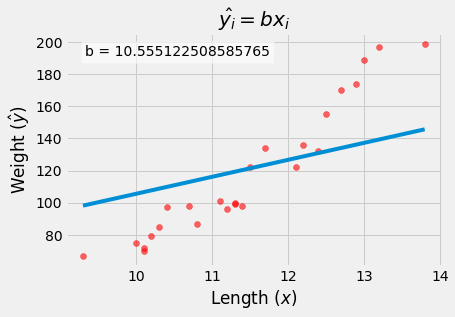

In [11]:
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(x, model1_b*x)
ax.scatter(x, y, alpha=.6, c='red')
textstr = r'b = {}'.format(model1_b)
props = dict(facecolor='white', alpha=.6)
plt.title('$\hat{y_i} = bx_i$')
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14, verticalalignment='top', bbox=props)
plt.ylabel("Weight $(\hat{y})$")
plt.xlabel('Length $({x})$')
plt.show()

### (d) Describe your MODEL 1 by filling the information below.

Final MODEL 1 equation is: $\hat{y}=10.555464977075626\ast x$

Minimum value of Error function is: $851.3093821919375$

Number of iterations ran to reach convergence: $42$


---

## Model 2: SLR => $\hat{y_i} = a + b x_i$

Now we apply the SLR model where both intercept $a$ and slope $b$ are to be determined when predicting *Weight (y)* using *Length (x)* as the predictor.


### (a) Express Error function $E(a, b)$ interms of $a$ and $b$. Hence, derive $E_a(a, b)$ and $E_b(a, b)$


In [12]:
from sympy import *
a = Symbol('a')
b = Symbol('b')
x = Symbol('x_i')
y_hat = Symbol('\hat y')
y = Symbol('y_i')
n = len(fish)
i = Symbol('i')
y_hat = a + b*x
residual = y - y_hat


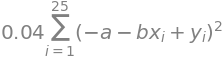

In [13]:
error = 1/n * Sum(residual**2, (i, 1, n))
error

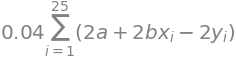

In [14]:
# With respect to a
diff(error, a)

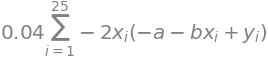

In [15]:
# With respect to b
diff(error, b)

### (b) Use gradient descent algorithm to find the values of $a$ and $b$ for which $E(a, b)$ is at its minimum.

In [16]:
# defining x and y
x = fish['Length'].values
y = fish['Weight'].values

next_b = 1 # Initial point of b
next_a = 1 # Initial point of a
alpha = 0.001 # Learning rate
epsilon = 0.001 # Stopping criterion constant
max_iters = 25000 # Maximum number of iterations

# Partial derivatives and function
partialf_a = lambda a,b: 1/25 * np.sum(2*a + 2 * b * x - 2 * y)
partialf_b = lambda a,b: 1/25 * np.sum(-2 * x * (-a -b*x+y))
func = lambda a,b: 1/25 * np.sum((y - (a + b*x))**2)

next_func = func(next_a,next_b) # Initial value of function

for n in range(max_iters):
    current_a = next_a
    current_b = next_b
    current_func = next_func
    next_a = current_a-alpha*partialf_a(current_a,current_b) # update of a
    next_b = current_b-alpha*partialf_b(current_a,current_b) # update of b
    next_func = func(next_a,next_b)
    change_func = abs(next_func-current_func) # stopping criterion: values of function converge
    print("Iteration",n+1,": a  ",next_a,",\tb = ",next_b,",\tE(a,b) = ",next_func)
    if change_func < epsilon:
        break

Iteration 1 : a   1.211424 ,	b =  3.507168 ,	E(a,b) =  7240.6504085085335
Iteration 2 : a   1.365021033472 ,	b =  5.345657321728 ,	E(a,b) =  4290.981618041594
Iteration 3 : a   1.476216821366772 ,	b =  6.693842037127772 ,	E(a,b) =  2705.0885453127953
Iteration 4 : a   1.556322180441961 ,	b =  7.682513857563215 ,	E(a,b) =  1852.4249994489476
Iteration 5 : a   1.6136306987983096 ,	b =  8.407575015769659 ,	E(a,b) =  1393.9798961120325
Iteration 6 : a   1.6542235998396508 ,	b =  8.939345244914545 ,	E(a,b) =  1147.485041524066
Iteration 7 : a   1.6825599039124082 ,	b =  9.329386064805123 ,	E(a,b) =  1014.944541161531
Iteration 8 : a   1.7019091607648054 ,	b =  9.615504648550303 ,	E(a,b) =  943.6712248472555
Iteration 9 : a   1.714668748010068 ,	b =  9.825422877580877 ,	E(a,b) =  905.3380089337402
Iteration 10 : a   1.7225965283089562 ,	b =  9.979467654092083 ,	E(a,b) =  884.7149301249003
Iteration 11 : a   1.726981443844246 ,	b =  10.092543556400036 ,	E(a,b) =  873.6136487777716
Iteration 1

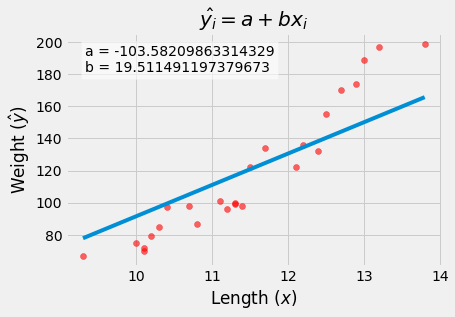

In [17]:
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(x, next_b*x+next_a)
ax.scatter(x, y, alpha=.6, c='red')
textstr = "a = {}\nb = {}".format(next_a, next_b)
props = dict(facecolor='white', alpha=.6)
plt.title('$\hat{y_i} = a+bx_i$')
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14, verticalalignment='top', bbox=props)
plt.ylabel("Weight $(\hat{y})$")
plt.xlabel('Length $({x})$')
plt.show()

### (c) Describe the changes and decisions you made on the parameters for your solution to reach convergeance.

From initial observation, the iteration count reached the limit, which can be concluded that the model did not reached convergence. Model 2 SLR produced a MSE (Mean Squared Error) of 404.16225317287956, which is better than the results produced in Model 1 SLR. 

To improve optimization, I will attempt to:
1. Set the initial b and a using the gradient and intercept of the two furthest points, 
based on $y\ =\ mx\ +\ c$
	- I noticed that b and a deviate a lot from the initial start point, which indicates that initial starting point matters to reach convergence faster
```python
next_b = (y[0] - y[-1]) / (x[0] - x[-1]) # Initial point of b
next_a = (y[0] - next_b * x[0]) # Initial point of c
```
2. Increase learning rate $\alpha$ to 0.0005
	- Reach convergence faster since model initially hit max iteration limit.
3. Decrease criterion/epsilon $\epsilon$ to 0.0001
	- A drawback to reducing learning rate is a trade off in accuracy, as such I would like to decrease the criterion value in order to mitigate any flaw in accuracy.


In [18]:
# defining x and y
x = fish['Length'].values
y = fish['Weight'].values

next_b = (y[0] - y[-1]) / (x[0] - x[-1]) # Initial point of b
next_a = (y[0] - next_b * x[0]) # Initial point of a
alpha = 0.005 # Learning rate
epsilon = 0.0001 # Stopping criterion constant
max_iters = 25000 # Maximum number of iterations

# Partial derivatives and function
partialf_a = lambda a,b: 1/25 * np.sum(2*a + 2 * b * x - 2 * y)
partialf_b = lambda a,b: 1/25 * np.sum(-2 * x * (-a -b*x+y))
func = lambda a,b: 1/25 * np.sum((y - (a + b*x))**2)

next_func = func(next_a,next_b) # Initial value of function

for n in range(max_iters):
    current_a = next_a
    current_b = next_b
    current_func = next_func
    next_a = current_a-alpha*partialf_a(current_a,current_b) # update of a
    next_b = current_b-alpha*partialf_b(current_a,current_b) # update of b
    next_func = func(next_a,next_b)
    change_func = abs(next_func-current_func) # stopping criterion: values of function converge
    print("Iteration",n+1," a =",next_a,", b =",next_b,",\tE(a,b) =",next_func)
    if change_func < epsilon:
        break

Iteration 1  a = -205.91848000000002 , b = 28.033704 ,	E(a,b) = 188.56191184667492
Iteration 2  a = -205.88699363392 , b = 28.468191538880003 ,	E(a,b) = 175.91409795574367
Iteration 3  a = -205.90556226495178 , b = 28.323865155598707 ,	E(a,b) = 174.49847886803127
Iteration 4  a = -205.9074227253152 , b = 28.37273532149637 ,	E(a,b) = 174.33423106534167
Iteration 5  a = -205.91485923766695 , b = 28.35712023766784 ,	E(a,b) = 174.3093988568141
Iteration 6  a = -205.9204337700985 , b = 28.36302898295225 ,	E(a,b) = 174.3001001340742
Iteration 7  a = -205.92662899036588 , b = 28.361753431002303 ,	E(a,b) = 174.292533288696
Iteration 8  a = -205.93261623324338 , b = 28.36287578558406 ,	E(a,b) = 174.28516069408946
Iteration 9  a = -205.93867209084462 , b = 28.363197696946738 ,	E(a,b) = 174.27781104422704
Iteration 10  a = -205.94470424228263 , b = 28.363786710872784 ,	E(a,b) = 174.27046525377875
Iteration 11  a = -205.9507435025205 , b = 28.364286501739038 ,	E(a,b) = 174.26312119620223
Iteration

In [19]:
model2 = {'a':[next_a],'b':[next_b]}

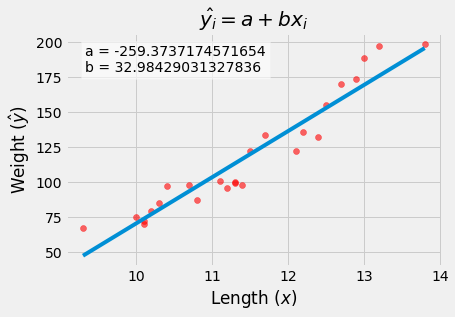

In [20]:
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(x, next_b*x+next_a)
ax.scatter(x, y, alpha=.6, c='red')
textstr = "a = {}\nb = {}".format(next_a, next_b)
props = dict(facecolor='white', alpha=.6)
plt.title('$\hat{y_i} = a+bx_i$')
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14, verticalalignment='top', bbox=props)
plt.ylabel("Weight $(\hat{y})$")
plt.xlabel('Length $({x})$')
plt.show()

### (d) Descibe your MODEL 2 by filling the information below.


## Conclusion on SLR


### (a)

Using Python (or other software), in a single figure, plot the data points (scatterplot) together with the linear lines representing the two models. Insert the figure below and descibe what you observe regarding the location of the data and the linear lines.


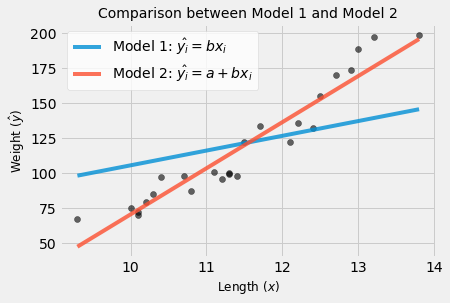

In [21]:
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(x, model1_b*x, alpha=.8, label='Model 1: $\hat{y_i}=bx_i$')
ax.plot(x, next_b*x+next_a, alpha=.8, label='Model 2: $\hat{y_i}=a+bx_i$')
ax.scatter(x, y, alpha=.6, c='black')
props = dict(facecolor='white', alpha=.6)
plt.title('Comparison between Model 1 and Model 2', fontsize=14)
plt.ylabel("Weight $(\hat{y})$", fontsize=12)
plt.xlabel('Length $({x})$', fontsize=12)
plt.legend(facecolor='white')
plt.show()

Model 1 SLR, the regression line $\hat{y_i}$ does not fit well to the training data, which can be seen that the line does not follow the direction of the data points. This is further supported by the very large residuals from the regression line, which explains the very high value in the error function $E\left(b\right)$. 

Whereas Model 2 SLR adding a parameter a, the regression line $\hat{y_i}$ fits well to the training data, as seen that the line follows the direction of the data point. It can be seen that the data points are located around Model 2 regression line, which explains the low value in the error function $E\left(a,b\right)$.


### (b)

In a linear regression model, the constant $a$ is commonly interpreted as the value of the response variable when the predictor variable is zero. In your Model 2, can you interpret your value of $a$ as such? Explain.

Assuming predictor variable $Length\ \left(x_i\right)=0$,
$Weight\ \left(\widehat{y_i}\right)=a=-259.3737174571654$, which seems impossible for a fish to have negative weight. As such, we reject the claim that constant  in Model 2 is commonly interpreted as the value of the response variable when the predictor variable is zero. 


---

## Model 3: MLR => $\hat{y_i} = a+bx_i+cw_i$

A linear regression model with more than 1 predictor is called **Multiple Linear Regression** MLR model. Apply the MLR Model where intercept a, and slopes b and c are to be determined, when predicting $Weight (y)$ using $Length (x)$ and $Width (w)$ as the predictors.


### (a) Explain how gradient descent algorithm can be extended for Model 3

In [22]:
from sympy import *
a = Symbol('a')
b = Symbol('b')
c = Symbol('c')
x = Symbol('x_i')
w = Symbol('w_i')
y_hat = Symbol('\hat y')
y = Symbol('y_i')
n = len(fish)
i = Symbol('i')
y_hat = a + b*x + c*w
residual = y - y_hat

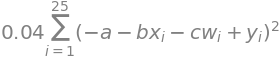

In [23]:

error = 1/n * Sum(residual**2, (i, 1, n))
error

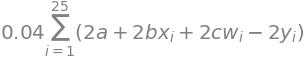

In [24]:
# With respect to a
diff(error, a)

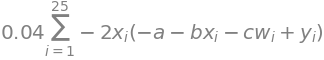

In [25]:
# With respect to b
diff(error, b)

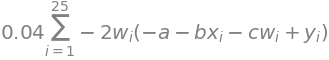

In [26]:
# With respect to c
diff(error, c)

(b) Use gradient descent algorithm to find the value of a, b, and c for which Error function is at its minimum.

In [27]:
# # defining x and y
# w = fish['Width'].values
# x = fish['Length'].values
# y = fish['Weight'].values

# next_c = 1 # Initial point of c
# next_b = 1 # Initial point of b
# next_a = 1 # Initial point of a
# alpha = 0.001 # Learning rate
# epsilon = 0.0001 # Stopping criterion constant
# max_iters = 40000 # Maximum number of iterations

# # Partial derivatives and function
# partialf_a = lambda a,b,c: 1/25 * np.sum(2*a + 2 * b * x + 2*c*w - 2 * y)
# partialf_b = lambda a,b,c: 1/25 * np.sum(-2 * x * (-a -b*x -c*w+y))
# partialf_c = lambda a,b,c: 1/25 * np.sum(-2 * w * (-a -b*x -c*w+y))
# func = lambda a,b,c: 1/25 * np.sum((y - (a + b*x + c*w))**2)

# next_func = func(next_a,next_b,next_c) # Initial value of function

# for n in range(max_iters):
#     current_a = next_a
#     current_b = next_b
#     current_c = next_c
#     current_func = next_func
#     next_a = current_a-alpha*partialf_a(current_a,current_b,current_c) # update of a
#     next_b = current_b-alpha*partialf_b(current_a,current_b,current_c) # update of b
#     next_c = current_c-alpha*partialf_c(current_a,current_b,current_c) # update of c
#     next_func = func(next_a,next_b,next_c)
#     change_func = abs(next_func-current_func) # stopping criterion
#     print("Iteration",n+1," a =",next_a,", b =",next_b, 
#         ', c =', next_c, ", E(a,b,c) =",next_func)
#     if change_func < epsilon:
#         break

Iteration 1  a = 1.208620304 , b = 3.4745271136 , c = 1.3130313694416 , E(a,b,c) = 6995.1915522614945
Iteration 2  a = 1.3592889498006366 , b = 5.2788646443194835 , c = 1.5434264336338888 , E(a,b,c) = 4114.8037709766695
Iteration 3  a = 1.4676981884864229 , b = 6.594486892573512 , c = 1.7135613258602787 , E(a,b,c) = 2583.083117623268
Iteration 4  a = 1.5452911151820177 , b = 7.553728452805044 , c = 1.8397531583443119 , E(a,b,c) = 1768.5311124314496
Iteration 5  a = 1.600412257725192 , b = 8.25309028876637 , c = 1.933900687140902 , E(a,b,c) = 1335.341463447402
Iteration 6  a = 1.6391466083372126 , b = 8.762942782777241 , c = 2.004680716930317 , E(a,b,c) = 1104.9454657122085
Iteration 7  a = 1.6659314618587358 , b = 9.134601388230532 , c = 2.05842054269637 , E(a,b,c) = 982.3872379488577
Iteration 8  a = 1.6840025801082164 , b = 9.405486333212108 , c = 2.099734151190735 , E(a,b,c) = 917.1729414343774
Iteration 9  a = 1.6957195436220187 , b = 9.602885176876164 , c = 2.1319861514320424 , E(

### (c) Describe the changes and decisions you made on the parameters for your solution to reach convergence.


In [28]:
%%time
# Define w, x and y
w = fish['Width'].values
x = fish['Length'].values
y = fish['Weight'].values

next_c = (y[0] - y[-1]) / (w[0] - w[-1]) # Initial point of c
next_b = (y[0] - y[-1]) / (x[0] - x[-1]) # Initial point of b
next_a = (y[0] - next_b*x[0] - next_c*w[0]) # Initial point of a
alpha = 0.005 # Learning rate
epsilon = 0.0001 # Stopping criterion constant
max_iters = 50000 # Maximum number of iterations

# Partial derivatives and function
partialf_a = lambda a,b,c: 1/25 * np.sum(2*a + 2 * b * x + 2*c*w - 2 * y)
partialf_b = lambda a,b,c: 1/25 * np.sum(-2 * x * (-a -b*x -c*w+y))
partialf_c = lambda a,b,c: 1/25 * np.sum(-2 * w * (-a -b*x -c*w+y))
func = lambda a,b,c: 1/25 * np.sum((y - (a + b*x + c*w))**2)

next_func = func(next_a,next_b,next_c) # Initial value of function

for n in range(max_iters):
    current_a = next_a
    current_b = next_b
    current_c = next_c
    current_func = next_func
    next_a = current_a-alpha*partialf_a(current_a,current_b,current_c) # update of a
    next_b = current_b-alpha*partialf_b(current_a,current_b,current_c) # update of b
    next_c = current_c-alpha*partialf_c(current_a,current_b,current_c) # update of c
    next_func = func(next_a,next_b,next_c)
    change_func = abs(next_func-current_func) # stopping criterion: values of function converge
    print("Iteration",n+1," a =",next_a,", b =",next_b,
     ', c =', next_c, ", E(a,b,c) =",next_func)
    if change_func < epsilon:
        break

Iteration 1  a = -372.7664926984128 , b = 21.164627174603176 , c = 157.67484470501591 , E(a,b,c) = 1563.1103357039804
Iteration 2  a = -372.4905159473776 , b = 24.060475164033488 , c = 157.98383012080464 , E(a,b,c) = 1009.8083844360589
Iteration 3  a = -372.5531471475543 , b = 23.040546309478213 , c = 157.81001110287693 , E(a,b,c) = 939.9930331637672
Iteration 4  a = -372.49595390203325 , b = 23.40641892077949 , c = 157.80708253319412 , E(a,b,c) = 930.7333287037579
Iteration 5  a = -372.4811766314137 , b = 23.281850572235637 , c = 157.74370007461482 , E(a,b,c) = 929.0584119869466
Iteration 6  a = -372.4513980232311 , b = 23.33084836517269 , c = 157.70173708386088 , E(a,b,c) = 928.3338383371898
Iteration 7  a = -372.42693821111914 , b = 23.318418451002515 , c = 157.65221835679097 , E(a,b,c) = 927.7286627882254
Iteration 8  a = -372.40060584326903 , b = 23.32772576803818 , c = 157.6053982848058 , E(a,b,c) = 927.13881165487
Iteration 9  a = -372.3749459545089 , b = 23.329338027979727 , c 

In [29]:
model3 = {'a':[next_a],'b':[next_b],'c':[next_c]}

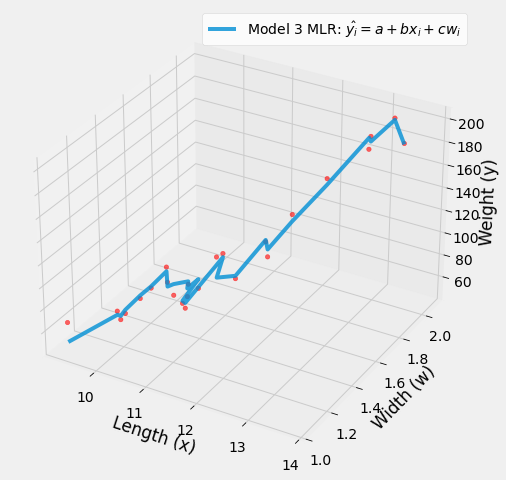

In [30]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot(x, w, next_c*w+next_b*x+next_a, alpha=.8, label='Model 3 MLR: $\hat{y_i}=a+bx_i+cw_i$')
ax.scatter(x, w, y, alpha=.6, c='red')
ax.set_xlabel('Length (x)')
ax.set_ylabel('Width (w)')
ax.set_zlabel('Weight (y)')
plt.legend(facecolor='white')
plt.show()

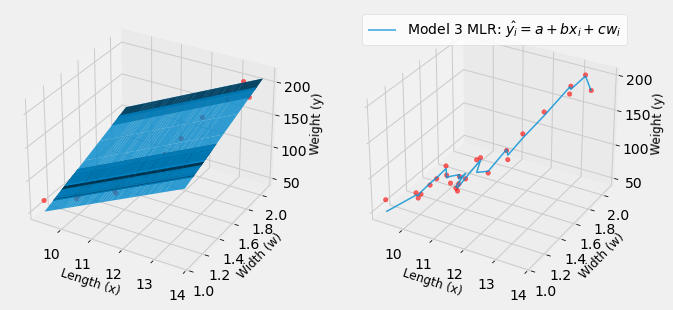

In [61]:
fig = plt.figure(figsize=(10, 8))
ax1 = fig.add_subplot(121, projection='3d')

xx, ww = np.meshgrid(x, w)
yy_hat = next_a + xx*next_b + ww*next_c
ax1.plot_surface(xx, ww, yy_hat, alpha=.8)
ax1.scatter(x, w, y, alpha=.6, c='red')
ax1.set_xlabel('Length (x)', fontsize=12)
ax1.set_ylabel('Width (w)', fontsize=12)
ax1.set_zlabel('Weight (y)', fontsize=12)

ax2 = fig.add_subplot(122, projection='3d')
ax2.plot(x, w, next_c*w+next_b*x+next_a, alpha=.8, label='Model 3 MLR: $\hat{y_i}=a+bx_i+cw_i$', linewidth=1.5)
ax2.scatter(x, w, y, alpha=.6, c='red')
ax2.set_xlabel('Length (x)', fontsize=12)
ax2.set_ylabel('Width (w)', fontsize=12)
ax2.set_zlabel('Weight (y)', fontsize=12)
plt.legend(facecolor='white')
plt.show()

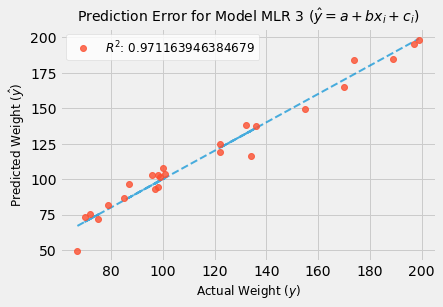

In [32]:
from sklearn.metrics import r2_score
y_hat = next_a + x*next_b + w*next_c
plt.plot(y, y, linewidth=2, linestyle='--', alpha=.7,)
plt.plot(y, y_hat, 'o', alpha=.8, label='$R^2$: {}'.format(r2_score(y, y_hat)))
plt.xlabel('Actual Weight ($y$)', fontsize=12)
plt.ylabel('Predicted Weight ($\hat{y}$)', fontsize=12)
plt.legend(facecolor='white', fontsize=12)
plt.title('Prediction Error for Model MLR 3 $(\hat{y}=a+bx_i+cw_i)$', fontsize=14)
plt.show()

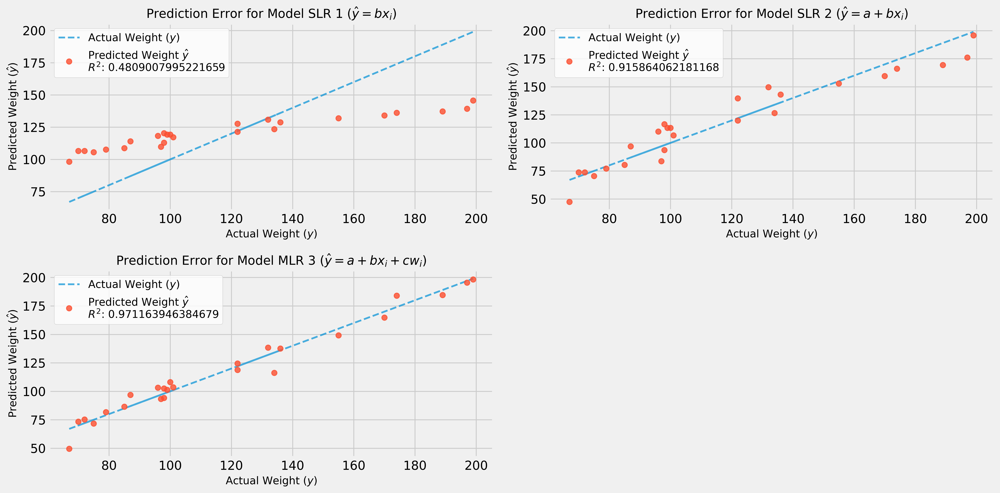

In [60]:
from sklearn.metrics import r2_score
fig = plt.figure(tight_layout=True, figsize=(16, 8), dpi=500)

# Model 1
y_hat = model1_b * x
ax = fig.add_subplot(221)
ax.plot(y, y, linewidth=2, linestyle='--', alpha=.7, label='Actual Weight $(y)$')
ax.plot(y, y_hat, 'o', alpha=.8, label='Predicted Weight $\hat{}$\n$R^2$: {}'.format('y', r2_score(y, y_hat)))
ax.set_xlabel('Actual Weight ($y$)', fontsize=12)
ax.set_ylabel('Predicted Weight ($\hat{y}$)', fontsize=12)
plt.legend(facecolor='white', fontsize=12)
plt.title('Prediction Error for Model SLR 1 $(\hat{y}=bx_i)$', fontsize=14)

# Model 2
y_hat = model2['a'] + model2['b'] * x
ax = fig.add_subplot(222)
ax.plot(y, y, linewidth=2, linestyle='--', alpha=.7, label='Actual Weight $(y)$')
ax.plot(y, y_hat, 'o', alpha=.8, label='Predicted Weight $\hat{}$\n$R^2$: {}'.format('y', r2_score(y, y_hat)))
ax.set_xlabel('Actual Weight ($y$)', fontsize=12)
ax.set_ylabel('Predicted Weight ($\hat{y}$)', fontsize=12)
plt.legend(facecolor='white', fontsize=12)
plt.title('Prediction Error for Model SLR 2 $(\hat{y}=a+bx_i)$', fontsize=14)

# Model 3
y_hat = model3['a']+model3['b'] * x + model3['c'] * w
ax = fig.add_subplot(223)
ax.plot(y, y, linewidth=2, linestyle='--', alpha=.7, label='Actual Weight $(y)$')
ax.plot(y, y_hat, 'o', alpha=.8, label='Predicted Weight $\hat{}$\n$R^2$: {}'.format('y', r2_score(y, y_hat)))
ax.set_xlabel('Actual Weight ($y$)', fontsize=12)
ax.set_ylabel('Predicted Weight ($\hat{y}$)', fontsize=12)
plt.legend(facecolor='white', fontsize=12)
plt.title('Prediction Error for Model MLR 3 $(\hat{y}=a+bx_i+cw_i)$', fontsize=14)

plt.show()